Изучим датасет Spotify_Youtube, содержащий информацию о песнях известных исполнителей, собранную с сервисов для прослушивания музыки: Spotify и YouTube.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from itertools import *

In [ ]:
df = pd.read_csv("/content/Spotify_Youtube.csv")
print(df.dtypes)

Unnamed: 0            int64
Artist               object
Url_spotify          object
Track                object
Album                object
Album_type           object
Uri                  object
Danceability        float64
Energy              float64
Key                 float64
Loudness            float64
Speechiness         float64
Acousticness        float64
Instrumentalness    float64
Liveness            float64
Valence             float64
Tempo               float64
Duration_ms         float64
Url_youtube          object
Title                object
Channel              object
Views               float64
Likes               float64
Comments            float64
Description          object
Licensed             object
official_video       object
Stream              float64
dtype: object


In [ ]:
df.columns

Index(['Unnamed: 0', 'Artist', 'Url_spotify', 'Track', 'Album', 'Album_type',
       'Uri', 'Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness',
       'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
       'Duration_ms', 'Url_youtube', 'Title', 'Channel', 'Views', 'Likes',
       'Comments', 'Description', 'Licensed', 'official_video', 'Stream'],
      dtype='object')

In [ ]:
df.head(25)

,Unnamed: 0,Artist,Url_spotify,Track,Album,Album_type,Uri,Danceability,Energy,Key,...,Url_youtube,Title,Channel,Views,Likes,Comments,Description,Licensed,official_video,Stream
0,0,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Feel Good Inc.,Demon Days,album,spotify:track:0d28khcov6AiegSCpG5TuT,0.818,0.705,6.0,...,https://www.youtube.com/watch?v=HyHNuVaZJ-k,Gorillaz - Feel Good Inc. (Official Video),Gorillaz,6.935552e+08,6220896.0,169907.0,Official HD Video for Gorillaz' fantastic trac...,True,True,1.040235e+09
1,1,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Rhinestone Eyes,Plastic Beach,album,spotify:track:1foMv2HQwfQ2vntFf9HFeG,0.676,0.703,8.0,...,https://www.youtube.com/watch?v=yYDmaexVHic,Gorillaz - Rhinestone Eyes [Storyboard Film] (...,Gorillaz,7.201164e+07,1079128.0,31003.0,The official video for Gorillaz - Rhinestone E...,True,True,3.100837e+08
2,2,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,spotify:track:64dLd6rVqDLtkXFYrEUHIU,0.695,0.923,1.0,...,https://www.youtube.com/watch?v=qJa-VFwPpYA,Gorillaz - New Gold ft. Tame Impala & Bootie B...,Gorillaz,8.435055e+06,282142.0,7399.0,Gorillaz - New Gold ft. Tame Impala & Bootie B...,True,True,6.306347e+07
3,3,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,On Melancholy Hill,Plastic Beach,album,spotify:track:0q6LuUqGLUiCPP1cbdwFs3,0.689,0.739,2.0,...,https://www.youtube.com/watch?v=04mfKJWDSzI,Gorillaz - On Melancholy Hill (Official Video),Gorillaz,2.117550e+08,1788577.0,55229.0,Follow Gorillaz online:\nhttp://gorillaz.com \...,True,True,4.346636e+08
4,4,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Clint Eastwood,Gorillaz,album,spotify:track:7yMiX7n9SBvadzox8T5jzT,0.663,0.694,10.0,...,https://www.youtube.com/watch?v=1V_xRb0x9aw,Gorillaz - Clint Eastwood (Official Video),Gorillaz,6.184810e+08,6197318.0,155930.0,The official music video for Gorillaz - Clint ...,True,True,6.172597e+08
5,5,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,DARE,Demon Days,album,spotify:track:4Hff1IjRbLGeLgFgxvHflk,0.760,0.891,11.0,...,https://www.youtube.com/watch?v=uAOR6ib95kQ,Gorillaz - DARE (Official Video),Gorillaz,2.590212e+08,1844658.0,72008.0,Follow Gorillaz online:\nhttp://gorillaz.com \...,True,True,3.238503e+08
6,6,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,New Gold (feat. Tame Impala and Bootie Brown) ...,New Gold (feat. Tame Impala and Bootie Brown) ...,single,spotify:track:2c3KCGq6UojB2c8UAFrRON,0.716,0.897,4.0,...,https://www.youtube.com/watch?v=BONNm0F7Tto,"Gorillaz - New Gold ft. Tame Impala, Bootie Br...",Dom Dolla,4.519960e+05,11686.0,241.0,"Gorillaz 'New Gold' ft. Tame Impala, Bootie Br...",False,True,1.066615e+07
7,7,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,She's My Collar (feat. Kali Uchis),Humanz (Deluxe),album,spotify:track:3lIxtCaROdRDuTnNBDm3n2,0.726,0.815,11.0,...,https://www.youtube.com/watch?v=f8NwLXYIHS4,Gorillaz - She's My Collar [HQ],SalvaMuñox,1.010982e+06,17675.0,260.0,𝐁̲𝐎̲𝐍̲𝐔̲𝐒̲:̲ Hu̳ma̳n̳z [̲̠̲𝐃̲̠̲𝐄̲̠̲𝐅̲̠̲𝐈̲̠̲𝐍̲̠...,False,False,1.596059e+08
8,8,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Cracker Island (feat. Thundercat),Cracker Island (feat. Thundercat),single,spotify:track:2W3ZpQg9i6lE6kmHbcdu9N,0.741,0.913,2.0,...,https://www.youtube.com/watch?v=S03T47hapAc,Gorillaz - Cracker Island ft. Thundercat (Offi...,Gorillaz,2.445982e+07,739527.0,20296.0,Listen to Cracker Island: https://gorillaz.lnk...,True,True,4.267190e+07
9,9,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Dirty Harry,Demon Days,album,spotify:track:2bfGNzdiRa1jXZRdfssSzR,0.625,0.877,10.0,...,https://www.youtube.com/watch?v=cLnkQAeMbIM,Gorillaz - Dirty Harry (Official Video),Gorillaz,1.547611e+08,1386920.0,39240.0,Follow Gorillaz online:\nhttp://gorillaz.com \...,True,True,1.910747e+08


Вывели первые 25 строк датасета. Можно сделать первчиное предположение, что от каждого исполнителя в датасете представлено 10 треков. Исследуем эту гипотезу чуть дальше.

In [ ]:
rows_count, columns_count = df.shape
print('Total Number of rows :', rows_count)
print('Total Number of columns :', columns_count)

Total Number of rows : 20718
Total Number of columns : 28


Датасет содержит 20718 строк и 27 колонок, не учитывая колонку числовых индексов. Среди них 12 содержат данные строкового типа – название трека, альбома, исполнителя, ссылки на YouTube и Spotify и т.д.
Оставшиеся 15 колонок содержат числовые данные типа float. Изучим их более подробно

In [ ]:
nums = df.select_dtypes(include=['number'])
nums.head(10)

,Unnamed: 0,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Stream
0,0,0.818,0.705,6.0,-6.679,0.1770,0.008360,0.002330,0.6130,0.772,138.559,222640.0,693555221.0,6220896.0,169907.0,1.040235e+09
1,1,0.676,0.703,8.0,-5.815,0.0302,0.086900,0.000687,0.0463,0.852,92.761,200173.0,72011645.0,1079128.0,31003.0,3.100837e+08
2,2,0.695,0.923,1.0,-3.930,0.0522,0.042500,0.046900,0.1160,0.551,108.014,215150.0,8435055.0,282142.0,7399.0,6.306347e+07
3,3,0.689,0.739,2.0,-5.810,0.0260,0.000015,0.509000,0.0640,0.578,120.423,233867.0,211754952.0,1788577.0,55229.0,4.346636e+08
4,4,0.663,0.694,10.0,-8.627,0.1710,0.025300,0.000000,0.0698,0.525,167.953,340920.0,618480958.0,6197318.0,155930.0,6.172597e+08
5,5,0.760,0.891,11.0,-5.852,0.0372,0.022900,0.086900,0.2980,0.966,120.264,245000.0,259021161.0,1844658.0,72008.0,3.238503e+08
6,6,0.716,0.897,4.0,-7.185,0.0629,0.012000,0.262000,0.3250,0.358,127.030,274142.0,451996.0,11686.0,241.0,1.066615e+07
7,7,0.726,0.815,11.0,-5.886,0.0313,0.007990,0.081000,0.1120,0.462,140.158,209560.0,1010982.0,17675.0,260.0,1.596059e+08
8,8,0.741,0.913,2.0,-3.340,0.0465,0.003430,0.103000,0.3250,0.643,120.012,213750.0,24459820.0,739527.0,20296.0,4.267190e+07
9,9,0.625,0.877,10.0,-7.176,0.1620,0.031500,0.081100,0.6720,0.865,192.296,230426.0,154761056.0,1386920.0,39240.0,1.910747e+08


Danceability (Танцевальность) – оценка танцевальности трека, учитывающая темп, мелодичность, ритм и т.д. Вещественное значение от 0 (нетанцевальный) до 1 (супер танцевальный).

Energy (Энергичность) – оценка энергичности трека, учитывающая громкость, скорость и агрессивность трека. Вещественное значение от 0 (не энергичный) до 1 (очень энергичный).

Key (Тональность) – тональность песни. Вещественное число от 0 (нота до) до 11 (нота си). Можно перевести в целые числа, чем займемся после.

Loudness (Громкость) – громкость трека. Вещественное число, выражающее среднее значение громкости на протяжении всего трека, выражается в децибеллах.

Speachiness (Разговорность) – коэффициент, оценивающий содержание чистой человеческой речи. Вещественное число от 0 (музыкальный трек без наличия слов) до 1 (аудиокнига или подкаст без музыки). Привычные нам песни располагаются в пределах 0.33-0.66, где реп-композиции набирают большее значение.

Acousticness (Акустика) – коэффициент, оценивающий, насколько простое продюсирование у трека. Вещественное число, где 0 – сложное продюсирование с неестественными инструментами, 1 – акустическая запись с живыми инструментами.

Instrumentalness (Инструментальность) – кооэффициент оценки инструментальности трека. Вещественное число, где 0 – полное отсутствие музыкальных инструментов, 1 - трек состоит только из инструментальной музыки.

Liveness (Живое исполнение) - коэффициент, оценивающий вероятность исполнения песни вживую. Вещественное число от 0 до 1.

Valence (Валентность) - коэффициент, оценивающий настроение трека. Вещественное число от 0 (грусть, злость) до 1 (веселье, позитив).

Tempo (Темп) - темп трека. Вещественное число – количество ударов в минуту.

Duration_ms (Длительность мс) - длительность трека в милисекундах. Может быть переведен в целое число.

Stream (Стрим) - количество прослушиваний на Spotify. Может быть переведен в целое число.

Views (Просмотры) - количество просмотров на YouTube. Может быть переведен в целое число.

Likes (Лайки) - количество лайков у песни на Youtube. Может быть перевден в целое число.

Comments (Комментарии) - количество комментариев на Youtube. Может быть переведен в целое число.



Стоит уделить внимание также двум текстоым колонкам, которые на самом деле содержат булевые значения:

Licensed (Лицензированный) – является ли контент лицензированным на сервисе YouTube.

official_video (Официальный клип) – является ли видео на YouTube официальным клипом на песню.

____________________________

Проверим датасет на пустые значения.

<Figure size 1000x600 with 0 Axes>

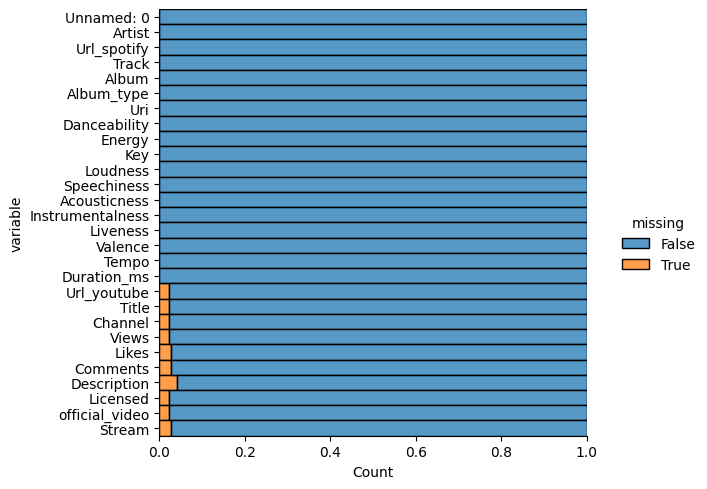

In [ ]:
plt.figure(figsize=(10,6))
sns.displot(
    data=df.isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=1.25
)

Замечаем небольшой процент (не более 5 процентов) недостающих данных, причем колонки Url_Youtube, Title, Channel, Description, Licensed, official-video содержат данные типа строк и потому нас не будут интересовать при изучении.

In [ ]:
df.isna().sum()

,0
Unnamed: 0,0
Artist,0
Url_spotify,0
Track,0
Album,0
Album_type,0
Uri,0
Danceability,2
Energy,2
Key,2


В колонках Danceability - Duration подозрительно совпадает число недостающих данных. Выведем эти данные.

In [ ]:
print((df[df.isna()["Danceability"] == True])["Unnamed: 0"])
print((df[df.isna()["Energy"] == True])["Unnamed: 0"])
print((df[df.isna()["Duration_ms"] == True])["Unnamed: 0"])

11890    11890
13843    13843
Name: Unnamed: 0, dtype: int64
11890    11890
13843    13843
Name: Unnamed: 0, dtype: int64
11890    11890
13843    13843
Name: Unnamed: 0, dtype: int64


Замечаем, что эти пропуски создают одни и те же два трека. Удалим их из датасета. Остальные данные заполним медианными значениями.

In [ ]:
df = df.drop([11890, 13843])

In [ ]:
df['Views'] = df['Views'].fillna(df['Views'].median())
df['Likes'] = df['Likes'].fillna(df['Likes'].median())
df['Comments'] = df['Comments'].fillna(df['Comments'].median())
df['Stream'] = df['Stream'].fillna(df['Stream'].median())
df['Licensed'] = df['Licensed'].fillna(df['Licensed'].median())
df['official_video'] = df['official_video'].fillna(df['official_video'].median())

In [ ]:
rows_count, columns_count = df.shape
print('Total Number of rows :', rows_count)
print('Total Number of columns :', columns_count)

Total Number of rows : 20716
Total Number of columns : 28


In [ ]:
df.isna().sum()

,0
Unnamed: 0,0
Artist,0
Url_spotify,0
Track,0
Album,0
Album_type,0
Uri,0
Danceability,0
Energy,0
Key,0


Проверим датасет на дубликаты.

In [ ]:
print(df[df.duplicated()])

Empty DataFrame
Columns: [Unnamed: 0, Artist, Url_spotify, Track, Album, Album_type, Uri, Danceability, Energy, Key, Loudness, Speechiness, Acousticness, Instrumentalness, Liveness, Valence, Tempo, Duration_ms, Url_youtube, Title, Channel, Views, Likes, Comments, Description, Licensed, official_video, Stream]
Index: []

[0 rows x 28 columns]


Дубликатов нет.

Переведем вещественные числа в целые в ранее упомянутых колонках.

In [ ]:
df["Key"] = df["Key"].astype(int)
df["Views"] = df["Views"].astype(int)
df["Likes"] = df["Likes"].astype(int)
df["Comments"] = df["Comments"].astype(int)
df["Stream"] = df["Stream"].astype(int)
df["Duration_ms"] = df["Duration_ms"].astype(int)
df["Artist"] = df["Artist"].str.replace(('$'), 's')

Преобразуем колонку с булевыми значениями в целочисленные.

In [ ]:
df['Licensed'] = df['Licensed'].astype(int)
df['official_video'] = df['official_video'].astype(int)

Можем удалить из датасета текстовые колонки, которые не дают нам нужной информации – ссылки треков на сервисах, название видео на YouTube (колонка с названием трека уже имеется в датасете), название канала, описание видео,

In [ ]:
df = df.drop(columns = ["Url_spotify", "Uri", "Url_youtube", "Title", "Channel", "Description"])

In [ ]:
df.isna().sum()

,0
Unnamed: 0,0
Artist,0
Track,0
Album,0
Album_type,0
Danceability,0
Energy,0
Key,0
Loudness,0
Speechiness,0


In [ ]:
rows_count, columns_count = df.shape
print('Total Number of rows :', rows_count)
print('Total Number of columns :', columns_count)

Total Number of rows : 20716
Total Number of columns : 22


Получили преобразованный датасет, с которым уже можно работать.

Посмотрим, сколько вхождений у каждого исполнителя.

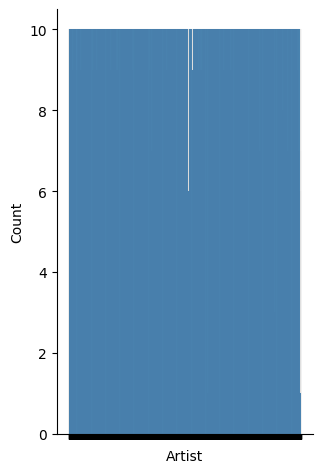

In [ ]:
g = sns.displot(data=df, x='Artist')
g.set(xticklabels = [])
plt.show()

Видим, что у каждого исполнителя количество представленных песен не превышает 10.

Проведем анализ числовых данных.

In [ ]:
nums = df.select_dtypes(include=['number'])
nums.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,20716.0,1.035826e+04,5.981146e+03,0.000000,5.178750e+03,1.035750e+04,1.553825e+04,2.071700e+04
Danceability,20716.0,6.197775e-01,1.652724e-01,0.000000,5.180000e-01,6.370000e-01,7.402500e-01,9.750000e-01
Energy,20716.0,6.352503e-01,2.141468e-01,0.000020,5.070000e-01,6.660000e-01,7.980000e-01,1.000000e+00
Key,20716.0,5.300348e+00,3.576449e+00,0.000000,2.000000e+00,5.000000e+00,8.000000e+00,1.100000e+01
Loudness,20716.0,-7.671680e+00,4.632749e+00,-46.251000,-8.858000e+00,-6.536000e+00,-4.931000e+00,9.200000e-01
Speechiness,20716.0,9.645601e-02,1.119600e-01,0.000000,3.570000e-02,5.050000e-02,1.030000e-01,9.640000e-01
Acousticness,20716.0,2.915353e-01,2.862988e-01,0.000001,4.520000e-02,1.930000e-01,4.772500e-01,9.960000e-01
Instrumentalness,20716.0,5.596156e-02,1.932620e-01,0.000000,0.000000e+00,2.405000e-06,4.630000e-04,1.000000e+00
Liveness,20716.0,1.935210e-01,1.685309e-01,0.014500,9.410000e-02,1.250000e-01,2.370000e-01,1.000000e+00
Valence,20716.0,5.298533e-01,2.454408e-01,0.000000,3.390000e-01,5.370000e-01,7.262500e-01,9.930000e-01


Видим, например, что средняя продолжительность очень близка по своему значению к медиане и равна 224718 мс = 225 с = 3:45. Замечаем интересный факт: хоть в последнее время и складывается тенденция выпускать короткие песни, не дольше 2 минут, среднее значение все равно значительно превышает 3 минуты.

Средний темп песни также совпадает с медианным значением и составляет 120 ударов в минуту. Интересный факт: этот темп является стандартным во многих цифровых звуковых рабочих станциях (приложениях для создания музыки).

По медианным значениям Licensed и official_video, равным единице, видим, что в выборке большинство представленных треков являются официальными релизами артистов.

Уберем песни длительностью больше 15 минут.

In [ ]:
index_list = df[df['Duration_ms'] > 900000].index
df = df.drop(index_list)
rows_count, columns_count = df.shape
print('Total Number of rows :', rows_count)
print('Total Number of columns :', columns_count)

Total Number of rows : 20695
Total Number of columns : 22


Построим теперь графики распределения этих величин.

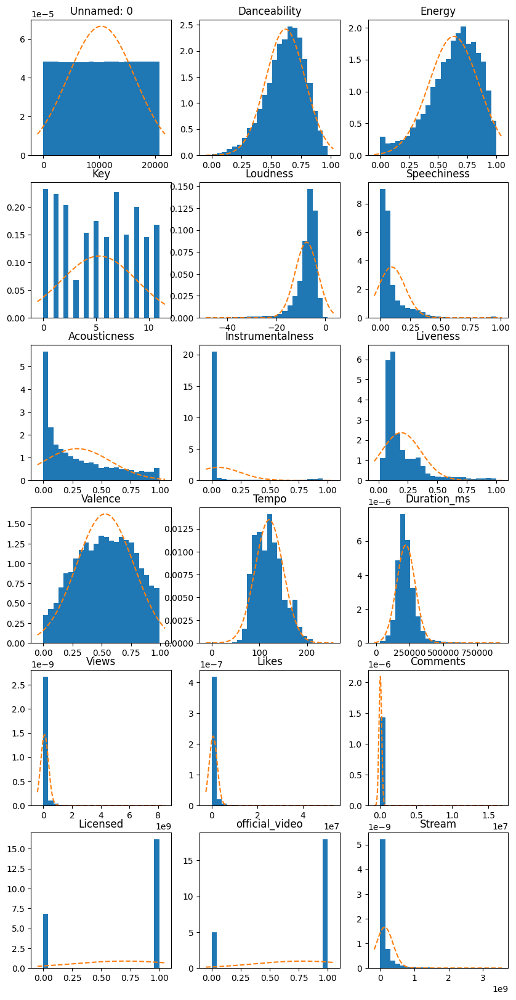

In [ ]:
keys = nums.columns

fig, axes = plt.subplots(nrows = 6, ncols = 3)
fig.set_size_inches(10, 20)
axes = axes.flatten()

for key, ax in zip(keys, axes):
    ax.hist(df[key], density=True, bins=23)

    loc = df[key].mean()
    scale = df[key].std()

    x_left, x_right = ax.get_xlim()
    x = np.linspace(x_left, x_right, 10000)
    y = stats.norm.pdf(x, loc=loc, scale=scale)

    ax.plot(x, y, linestyle='dashed')
    ax.set_title(key)

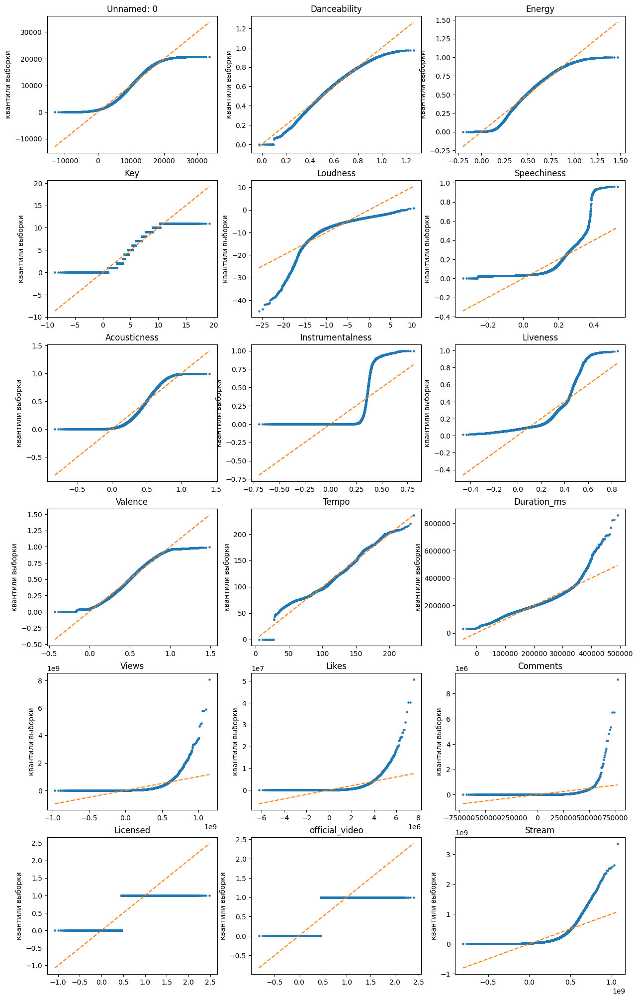

In [ ]:
fig, axes = plt.subplots(nrows = 6, ncols = 3)
fig.set_size_inches(15, 25)
axes = axes.flatten()

for key, ax in zip(keys, axes):
    samples = df[key]

    loc = samples.mean()
    scale = samples.std()

    interval = np.linspace(0, 1, samples.shape[0])[1:-1]
    x = stats.norm.ppf(interval, loc=loc, scale=scale)
    y = np.quantile(samples, interval)

    ax.scatter(x, y, s=5)
    ax.plot(x, x, color='C1', linestyle='dashed')

    ax.set_title(key)
    ax.set_ylabel('квантили выборки')

По графикам видно, что более или менее нормальное распределение имеют Танцевальность, Энергичность, Длительность, Настроение, Темп. Булевые Licensed и official_video логично не обладают нормальным распределением.


Изучая график распределения Key, можно сделать следующие выводы:
1. Распределение песен не одинаково по тональностям
2. Самой популярной тональностью является До мажор.
3. Самой непопулярной тональностью является Ми Бемоль Мажор.
4. Наблюдаются явные пики, соответсвующие белым клавишам пианино– например, соль, ля, си; в то время как графики проседают на черных клавишах - бемоли и диезы.

Изучая график Loudness, делаем вывод, что большинство песен стремятся к более громкому звучанию. Интересный факт: было проведено исследование, что чем громче песня, тем лучше она "застревает" в голове слушателя.

По графикам Speechiness и Instrumentalness можно сделать вывод, что выпускается гораздо больше композиций с человеческим голосом.


По графику Acousticness: акустичность песен в целом распределена равномерно, хотя заметен явный пик на "over-produced" треках.

График Liveness: довольно логичный вывод – песни, записанные в студии с использованием вокальных эффектов, превалируют над песнями, исполненными вживую.

Графики Views, Comments, Likes, Streams показывают в прицнипе одну и ту же величину – популярность песни. И вывод также логичен: непопулярных песен гораздо больше, чем популярных.

__________________________________

Проверим теперь, популярно ли на Spotify то, что популярно на YouTube и наоборот. Другими словами, есть ли регрессия между значениями Stream и Views.

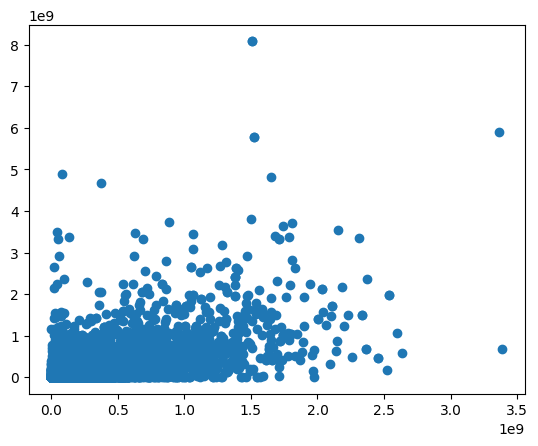

In [ ]:
plt.scatter(df['Stream'], df['Views'])
plt.show()

С первого взгляда, явной связи нет.
Рассчитаем значения регрессии.

In [ ]:
ones = np.ones((20695,1))
x_pot = np.hstack((ones, df['Stream'].values.reshape(20695,1)))

XTX = x_pot.T.dot(x_pot)
XTX_inv = np.linalg.inv(XTX)

b = XTX_inv.dot(x_pot.T).dot(df['Views'])
z = x_pot.dot(b)
e = df['Views'] - z

In [ ]:
def sum_of_squares(samples: np.ndarray) -> float:
    return ((samples - samples.mean()) ** 2).sum()

In [ ]:
R = 1 - sum_of_squares(e) / sum_of_squares(np.array(df['Views']))
print(R)

0.3560676255662063


Между переменными существует положительная зависимость, но она не очень сильная. Проведем статистический тест.

In [ ]:
n = 20695
m = 1

k1 = m
k2 = n - m - 1

alpha = 0.05

t = stats.f.ppf(1 - alpha, k1, k2)
print(t)

F = (R / k1) / ((1 - R) / k2)
print(F)

3.8419082450745794
11442.362068408573


Так как F >> t, то зависимость есть.

______________________________

Проверим, правда ли существует зависимость между громкостью и популярностью. В качестве показателя популярности будем использовать количество прослушиваний на Spotify.

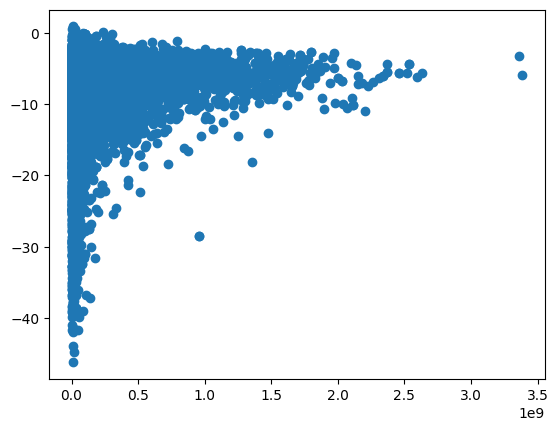

In [ ]:
plt.scatter(df['Stream'], df['Loudness'])
plt.show()

Виден явный пик популярности песен при определенном значении громкости, стремящемуся к максимуму.

In [ ]:
ones = np.ones((20695,1))
x_pot = np.hstack((ones, df['Stream'].values.reshape(20695,1)))

XTX = x_pot.T.dot(x_pot)
XTX_inv = np.linalg.inv(XTX)

b = XTX_inv.dot(x_pot.T).dot(df['Loudness'])
z = x_pot.dot(b)
e = df['Loudness'] - z

R = 1 - sum_of_squares(e) / sum_of_squares(np.array(df['Loudness']))
print(R)

0.014129243164817895


Тем не менее, коэффициент регрессии показывает, что связи нет.

In [ ]:
n = 20695
m = 1

k1 = m
k2 = n - m - 1

alpha = 0.05

t = stats.f.ppf(1 - alpha, k1, k2)
print(t)

F = (R / k1) / ((1 - R) / k2)
print(F)

3.8419082450745794
296.56669171135195


Опять получили, что F > t, что означает, что зависимость действительно есть.

Построим коррелограмму.

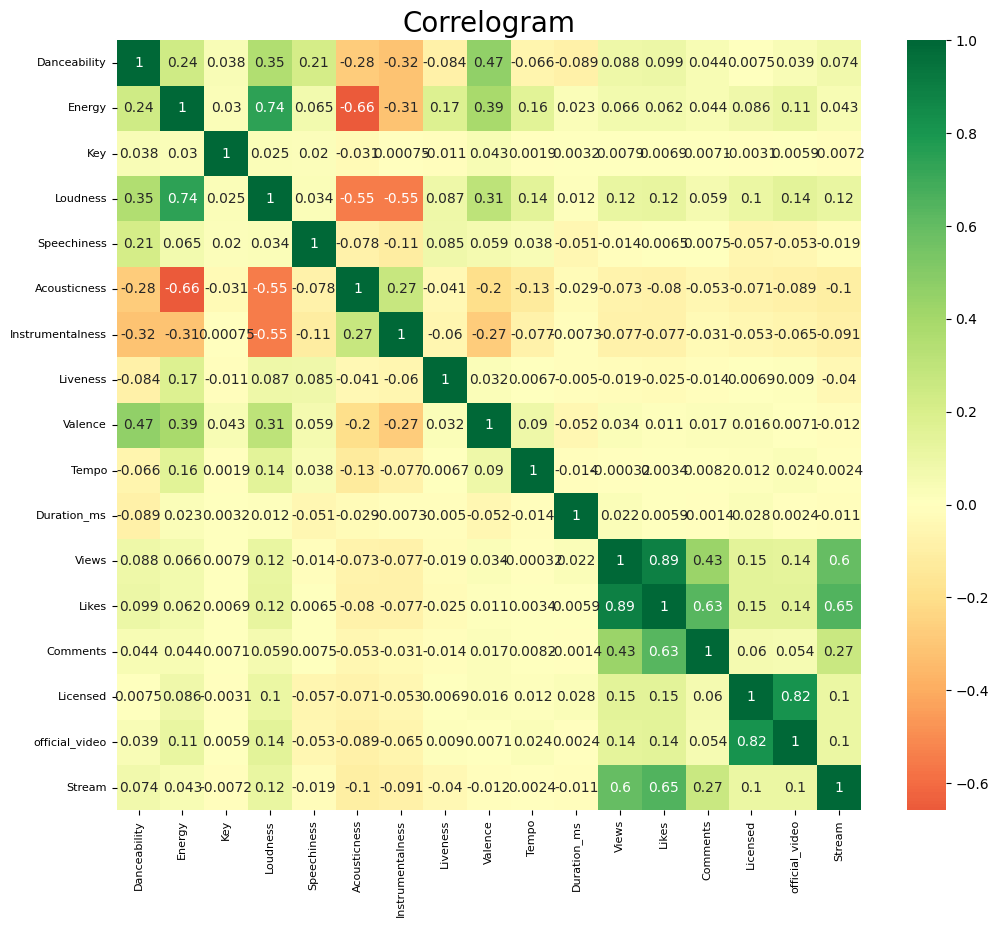

In [ ]:
plt.figure(figsize=(12,10))
nums = nums.drop(columns = "Unnamed: 0")
sns.heatmap(nums.corr(), xticklabels=nums.corr().columns, yticklabels=nums.corr().columns, cmap='RdYlGn', center=0, annot=True)

plt.title('Correlogram', fontsize=20)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()

Заметна явная прямая зависимость между количеством просмотров, колиечтсвом лайков и количеством комментариев, что является довольно логичным.

Также видим прямую зависимость между Licensed и official_video, то есть, у верифицированных артистов почти всегда есть официальные клипы на свои песни.

Видим прямую зависимость между количеством стримов на Spotify и количеством просмотров на YouTube, что подтверждает нашу выдвинутую гипотезу.

Видим прямую зависимость между танцевальностью и настроением. Значит, большинство танцевальных треков являются позитивными, в то время как не танцевальные треки относятся к грустным.

Также видим прямую зависимость между настроением и энергией. Чем более энергична композиция, тем более позитивный у неё вайб.

Очевидна прямая зависимость между энергичностью песни и громкостью. Чем энергичнее композиция, тем она громче.

Также заметна связь между акустичностью трека и его инструментальностью. Эта связь также логична: чем больше в песне настоящих инструментов, тем меньше слов.

Сразу заметна обратная зависимость энергичности и акустичности трека. Значит, акустические песни имеют тенденцию обладать более спокойной и меланхоличной атмосферой.

Видим обратную зависимость между громкостью и инструментальностью с акустичностью.

Обратная связь между танцевальностью и инструментальностью с акустичностью подтверждает тот факт, что Лунную Сонату Бетховена не включают в клубах.

Инструментальные треки (классическую музыку) описывают чаще, как депрессивную.

_____________________________________

Правда ли что популярные треки более энергичные и танцевальные? Чтобы проверить это, создадим дополнительную колонку Listens, в которой будет просто сумма прослушиваний на Spotify и просмотров на YouTube. Потом разделим датасет по третьему квартилю.

In [ ]:
df["Listens"] = df["Views"] + df["Stream"]

In [ ]:
df.head(2)

,Unnamed: 0,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,...,Valence,Tempo,Duration_ms,Views,Likes,Comments,Licensed,official_video,Stream,Listens
0,0,Gorillaz,Feel Good Inc.,Demon Days,album,0.818,0.705,6,-6.679,0.1770,...,0.772,138.559,222640,693555221,6220896,169907,1,1,1040234854,1733790075
1,1,Gorillaz,Rhinestone Eyes,Plastic Beach,album,0.676,0.703,8,-5.815,0.0302,...,0.852,92.761,200173,72011645,1079128,31003,1,1,310083733,382095378


In [ ]:
Q3 = df["Listens"].quantile(0.75)
popular = df[df["Listens"] >= Q3]
unpopular = df[df["Listens"] < Q3]
print(popular.shape, unpopular.shape)

(5174, 23) (15521, 23)


In [ ]:
nums["Popular"] = df["Listens"] >= Q3

In [ ]:
def var_analise(df, df1, df2, f):
  all1 = df1.shape[0]
  all2 = df2.shape[0]
  res1_mean = df1[f].mean()
  res2_mean = df2[f].mean()
  res_mean = df[f].mean()
  SS_b = all1 * (res1_mean - res_mean) ** 2 + all2 * (res2_mean - res_mean) ** 2
  SS_w = ((df1[f] - res1_mean) ** 2).sum() + ((df2[f]- res2_mean) ** 2).sum()

  k = 2
  n = all1 + all2
  k1 = k - 1
  k2 = n - k
  sigma2_b = SS_b / k1
  sigma2_w = SS_w / k2

  F = sigma2_b / sigma2_w

  alpha = 0.05

  t = stats.f.ppf(1 - alpha, k1, k2)

  return F>t

In [ ]:
print(var_analise(df, popular, unpopular, 'Energy'))
print(var_analise(df, popular, unpopular, 'Danceability'))
print(var_analise(df, popular, unpopular, 'Loudness'))

True
True
True


Действительно, видим, что существует связь между энергичностью, танцевальностью и популярностью песни.

In [ ]:
res_popular_mean = popular['Energy'].mean()
res_unpopular_mean = unpopular['Energy'].mean()
print("Energy")
print(f'Popular: {res_popular_mean}, unpopular: {res_unpopular_mean}')

res_popular_mean = popular['Danceability'].mean()
res_unpopular_mean = unpopular['Danceability'].mean()
print("Danceability")
print(f'Popular: {res_popular_mean}, unpopular: {res_unpopular_mean}')

res_popular_mean = popular['Loudness'].mean()
res_unpopular_mean = unpopular['Loudness'].mean()
print("Loudness")
print(f'Popular: {res_popular_mean}, unpopular: {res_unpopular_mean}')

Energy
Popular: 0.6652743332044839, unpopular: 0.6251526856710263
Danceability
Popular: 0.6487986084267491, unpopular: 0.6102587462148058
Loudness
Popular: -6.408967723231543, unpopular: -8.091414019715225


А настроение песни?

In [ ]:
print(var_analise(df, popular, unpopular, 'Valence'))

False


Получили результат – связи между популярностю песни и ее настроением нет. Люди одинаково любят и грустные, и весёлые песни.

___________________________________________________________________

Проверим, зависит ли популярность песни от наличия официального клипа.

In [ ]:
official = df[df["official_video"] == 1]
unofficial = df[df["official_video"] == 0]
print(official.shape, unofficial.shape)

(16175, 23) (4520, 23)


In [ ]:
print(var_analise(df, official, unofficial, 'Listens'))

True


In [ ]:
res_off_mean = official['Listens'].mean()
res_unoff_mean = unofficial['Listens'].mean()
print("Listens")
print(f'Popular: {res_off_mean}, unpopular: {res_unoff_mean}')

Listens
Popular: 258224465.66306028, unpopular: 110185838.89137168


Зависимость действительно есть. Наличие официального клипа гарантирует бОльшую популярность трека.

________________________________________________

А больше ли прослушиваний у треков с альбомов, чем у единичных синглов?

In [ ]:
album = df[df["Album_type"] == "album"]
single = df[df["Album_type"] != "album"]
print(album.shape, single.shape)

(14918, 23) (5777, 23)


In [ ]:
print(var_analise(df, album, single, 'Listens'))

True


In [ ]:
res_album_mean = album['Listens'].mean()
res_single_mean = single['Listens'].mean()
print("Listens")
print(f'Popular: {res_album_mean}, unpopular: {res_single_mean}')

Listens
Popular: 244313291.59163427, unpopular: 178320069.2271075


Да, треки на альбоме в среднем набирают больше прослушиваний, чем выпущенные отдельно песни.

________________________________________________________________________

In [ ]:
white_keys_array = [0, 2, 4, 5, 7, 9, 11]
black_keys_array = [1, 3, 6, 8, 10]
white_keys = df[df["Key"].isin(white_keys_array)]
black_keys = df[df["Key"].isin(black_keys_array)]

In [ ]:
nums["White_keys"] = nums["Key"].isin(white_keys_array)

In [ ]:
nums.head(2)

,Unnamed: 0,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Licensed,official_video,Stream,Popular,White_keys
0,0,0.818,0.705,6,-6.679,0.1770,0.00836,0.002330,0.6130,0.772,138.559,222640,693555221,6220896,169907,1,1,1040234854,True,False
1,1,0.676,0.703,8,-5.815,0.0302,0.08690,0.000687,0.0463,0.852,92.761,200173,72011645,1079128,31003,1,1,310083733,True,False


Error in callback <function _draw_all_if_interactive at 0x7f4cafd76830> (for post_execute):


KeyboardInterrupt: 

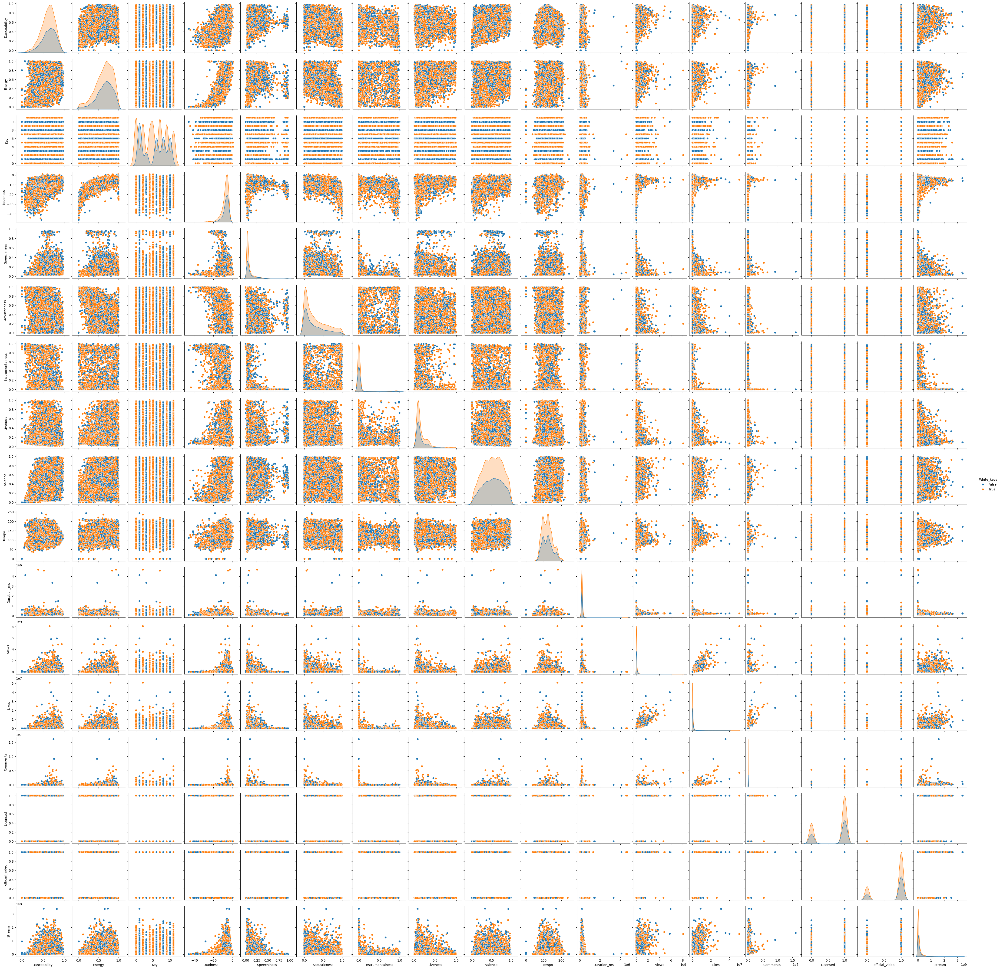

In [ ]:
sns.pairplot(nums, hue="White_keys")

Выдвинем гипотезу: песни, исполняемые вживую, легче играть на инструментах с использованием тональностей, построенных от белых клавишей пианино. Есть ли связь между этими двумя параметрами? Заодно проверим связь тональностей с другими параметрами: акустичность, настроение, инструментальность.

In [ ]:
print(f"White keys and liveness: {var_analise(df, white_keys, black_keys, 'Liveness')}")
print(f"White keys and acousticness: {var_analise(df, white_keys, black_keys, 'Acousticness')}")
print(f"White keys and valence: {var_analise(df, white_keys, black_keys, 'Valence')}")
print(f"White keys and instrumentalness: {var_analise(df, white_keys, black_keys, 'Instrumentalness')}")

White keys and liveness: True
White keys and acousticness: True
White keys and valence: False
White keys and instrumentalness: True


Наша гипотеза подтвердилась: в живых выступлениях чаще прибегают к более простым для исполнения тональностям. Тот же факт дублируется по сути в параметрах Акустичность и Инстурментальность, так как при записи там также участвуют живые инструменты. А вот настроение и использование белых или черных клавиш никак не связаны.

**Основные выводы**

Самой популярной тональностью является До мажор. Самой непопулярной тональностью является Ми Бемоль Мажор. Песен, использующих тональности, построенные на белых клавишах пианино, гораздо больше, чем песен на черных клавишах.

Средняя продолжительность современного трека составляет 3:45. А самый популярный темп – 120 ударов в минуту.

Существует связь между популярностью песни на Spotify и ее популярностью на YouTube. То есть на обеих платформах популярен примерно один и тот же контент.

Также действительно существует связь между громкостью трека и его популярностью. Громкие треки в среднем набирают больше прослушиваний.

Была выявлена зависимость между танцевальностью песни и ее популярностью. Танцевальные треки чаще становятся популярными. То же самое касается энергичности трека. А вот настроение трека никак не сказывается на его популярности.

При выступлении вживую артисты прибегают к исполнению песен в удобных для игры тональностях – построенных на белых клавишах. То же самое касается записи акустичных и инструментальных треков с использованием живых музыкальных инструментов.

Помимо этого, песни с альбомов набирают больше прослушиваний, чем отдельные синглы. К тому же, наличие официального клипа также положительно сказывается на популярности трека.